In [10]:
import os
import matplotlib.pyplot as plt
import numpy
from pynput.keyboard import Key, Listener
import shutil
import cv2
from PIL import Image

In [4]:
# Set the path to the directory containing images
image_directory = "data"

# Set the path to the directory where you want to copy the selected images
output_directory = "yes"

# Create the output directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Get a list of image files in the directory
image_files = [f for f in os.listdir(image_directory) if f.lower().endswith((".tif"))]

# Initialize variables to keep track of the current image index
current_index = 0

In [5]:
image_files

['M-33-7-A-d-2-3.tifpatch_09.tif',
 'M-33-7-A-d-2-3.tifpatch_013.tif',
 'M-33-7-A-d-2-3.tifpatch_010.tif',
 'M-33-7-A-d-2-3.tifpatch_08.tif',
 'M-33-7-A-d-2-3.tifpatch_06.tif',
 'M-33-7-A-d-2-3.tifpatch_07.tif',
 'M-33-7-A-d-2-3.tifpatch_05.tif',
 'M-33-7-A-d-2-3.tifpatch_12.tif',
 'M-33-7-A-d-2-3.tifpatch_011.tif',
 'M-33-7-A-d-2-3.tifpatch_015.tif',
 'M-33-7-A-d-2-3.tifpatch_02.tif']

In [11]:
def display_image(index):
    # Get the path of the current image
    current_image_path = os.path.join(image_directory, image_files[index])

    # Open and display the image
    
    image = cv2.imread(current_image_path)
    plt.imshow(image)
    plt.axis('off')
    plt.show()

In [12]:
def on_key_press(key):
    global current_index

    # Handle key presses
    if key == Key.up:
        # Move to the previous image
        current_index = (current_index - 1) % len(image_files)
        display_image(current_index)

    elif key == Key.down:
        # Move to the next image
        current_index = (current_index + 1) % len(image_files)
        display_image(current_index)

    elif key == Key.enter:
        # Copy the current image to the output directory
        source_path = os.path.join(image_directory, image_files[current_index])
        destination_path = os.path.join(output_directory, image_files[current_index])
        shutil.copy2(source_path, destination_path)
        print(f"Image '{image_files[current_index]}' copied to {output_directory}")

    elif key == Key.esc:
        # Stop the listener
        return False

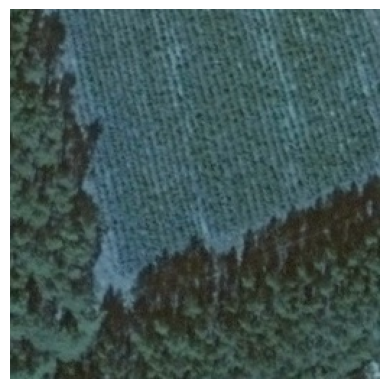

In [13]:
# Display the first image
display_image(current_index)

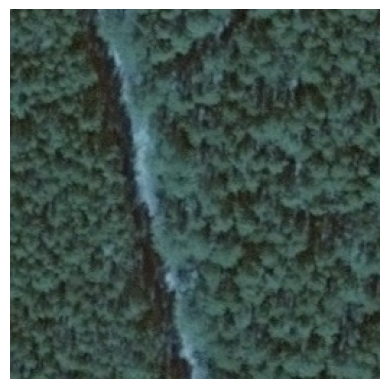

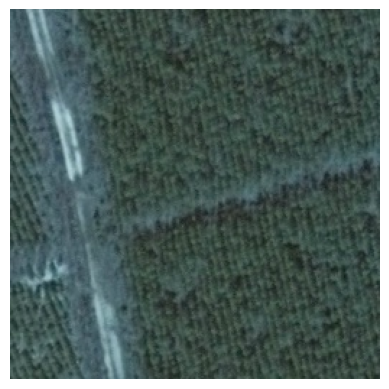

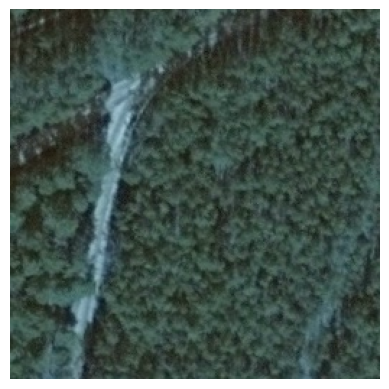

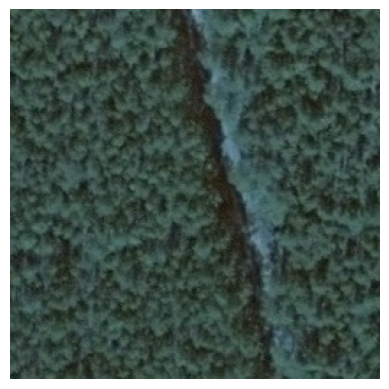

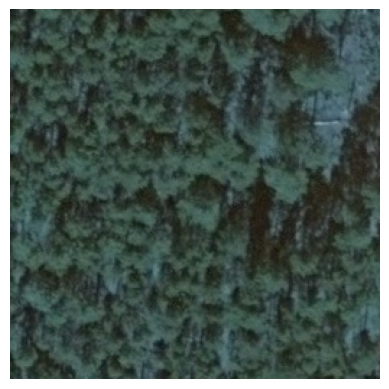

...

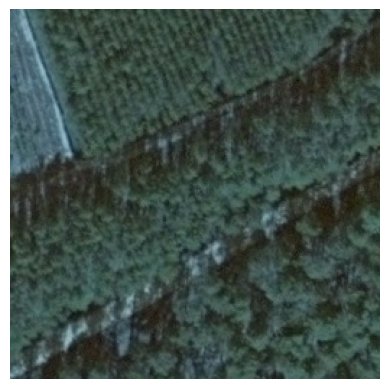

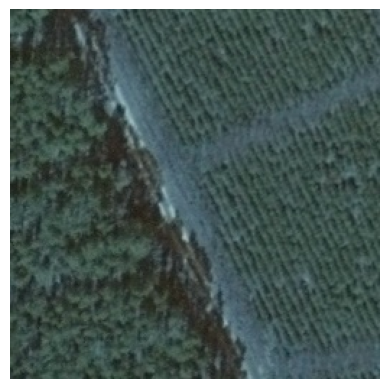

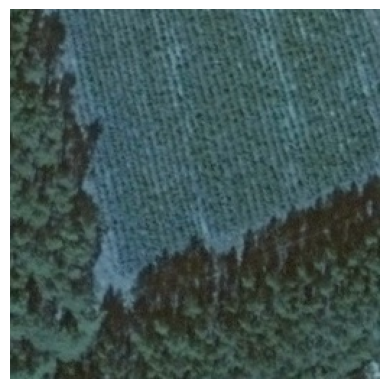

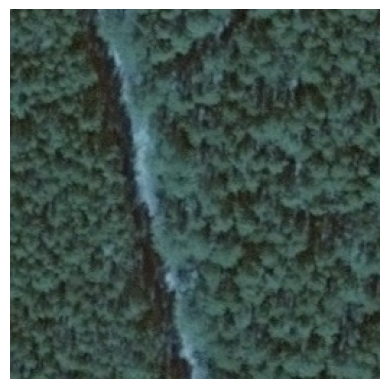

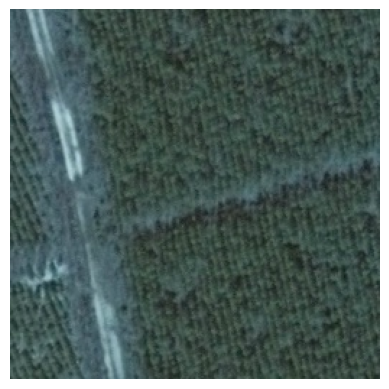

KeyboardInterrupt: 

In [14]:
with Listener(on_press=on_key_press) as listener:
    listener.join()